# 🔥 Wildfire Intelligence System v3.0

## ✅ All Bugs Fixed
| Bug | Root Cause | Fix Applied |
|-----|-----------|-------------|
| `dtype='string'` in Keras 3 | `tf.data` exposes string path tensors to Keras engine | **`keras.utils.PyDataset`** — loads images in pure numpy, zero strings |
| Bad accuracy | EfficientNetB0 got `[0,1]` inputs instead of `[-1,1]` | Manual `(pixel/127.5)-1.0` scaling |
| Grad-CAM blank | Was HSV colour thresholding, not gradients | Real `GradientTape` on `top_conv` layer |
| U-Net masks empty | Synthetic circular blobs, not real fire regions | HSV fire-colour detection masks |
| Gradio UI crash | `canvas.tostring_rgb()` fails on Colab | `BytesIO` + PIL approach |
| Hue augmentation | Destroyed fire's red/orange signature | Removed `random_hue` |

## ⚡ Quick Start
1. **Runtime → Change runtime type → T4 GPU**
2. Run cells **top to bottom** — no skipping
3. Update `zip_path` in Cell 3 if your dataset has a different name

## 🔧 Cell 1 — Install all libraries

In [1]:
# Run this first — restart runtime after if prompted
!pip install -q gradio plotly fpdf2 scikit-image scikit-learn tqdm seaborn
!pip install -q opencv-python-headless Pillow
print("✅ All libraries installed")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.0/81.0 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 327.1/327.1 kB 11.6 MB/s eta 0:00:00
✅ All libraries installed


## 📦 Cell 2 — Imports

In [2]:
import os, gc, random, warnings, shutil, datetime, io, traceback
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import cv2
import seaborn as sns
from tqdm import tqdm
from PIL import Image
import psutil

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight

warnings.filterwarnings('ignore')

print('='*60)
print('🔥 WILDFIRE INTELLIGENCE SYSTEM v3.0'.center(60))
print('='*60)
print(f'TensorFlow : {tf.__version__}')
print(f'Keras      : {keras.__version__}')
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try: tf.config.experimental.set_memory_growth(gpus[0], True)
    except: pass
    print(f'GPU        : {gpus[0].name} ✅')
else:
    print('⚠️  No GPU — go to Runtime → Change runtime type → T4 GPU')
print(f'RAM        : {round(psutil.virtual_memory().total/1024**3)} GB')
print('='*60)

            🔥 WILDFIRE INTELLIGENCE SYSTEM v3.0             
TensorFlow : 2.19.0
Keras      : 3.13.2
GPU        : /physical_device:GPU:0 ✅
RAM        : 13 GB


## 📂 Cell 3 — Mount Drive & Extract Dataset

In [3]:
from google.colab import drive
import zipfile

drive.mount('/content/drive')

zip_path     = '/content/drive/MyDrive/Wildfire_dataset.zip'
extract_path = '/content/dataset'
os.makedirs(extract_path, exist_ok=True)

if os.path.exists(zip_path):
    print('Extracting dataset...')
    with zipfile.ZipFile(zip_path, 'r') as z:
        z.extractall(extract_path)
    print('✅ Extraction complete!')
else:
    print(f'⚠️  Not found: {zip_path}')
    print('Update zip_path to point to your dataset.')

print('\n📁 Dataset structure:')
total = 0
for root, dirs, files in os.walk(extract_path):
    level = root.replace(extract_path, '').count(os.sep)
    if level < 3:
        imgs = [f for f in files if f.lower().endswith(('.jpg','.jpeg','.png'))]
        total += len(imgs)
        if imgs or level == 0:
            print(f'{"  "*level}📂 {os.path.basename(root) or "dataset"}/  ({len(imgs)} images)')
print(f'\n✅ Total: {total:,} images')

Mounted at /content/drive
Extracting dataset...
✅ Extraction complete!

📁 Dataset structure:
📂 dataset/  (0 images)
    📂 nowildfire/  (2820 images)
    📂 wildfire/  (3480 images)
    📂 nowildfire/  (2820 images)
    📂 wildfire/  (3480 images)
    📂 nowildfire/  (14500 images)
    📂 wildfire/  (15750 images)

✅ Total: 42,850 images


## ⚙️ Cell 4 — Config & Class Discovery

In [4]:
IMG_SIZE   = (224, 224)
BATCH_SIZE = 32
data_dir   = '/content/dataset'

def find_class_root(base):
    """Walk until we find a folder whose subdirs contain images."""
    for root, dirs, files in os.walk(base):
        for d in sorted(dirs)[:5]:
            p = os.path.join(root, d)
            imgs = [f for f in os.listdir(p)
                    if f.lower().endswith(('.jpg','.jpeg','.png'))]
            if len(imgs) > 5:
                return root
    return base

image_root  = find_class_root(data_dir)
CLASS_NAMES = sorted([d for d in os.listdir(image_root)
                      if os.path.isdir(os.path.join(image_root, d))])
NUM_CLASSES = len(CLASS_NAMES)
print(f'📂 Image root : {image_root}')
print(f'📋 Classes    : {CLASS_NAMES}')

# Build risk map
RISK_MAP = {}
for c in CLASS_NAMES:
    cl = c.lower().replace('_','').replace('-','').replace(' ','')
    if any(x in cl for x in ['nofire','nowildfire','nonfire','safe','clear','normal']):
        RISK_MAP[c] = 'Low Risk'
    elif any(x in cl for x in ['fire','burn','flame','blaze','wildfire','hot']):
        RISK_MAP[c] = 'High Risk'
    else:
        RISK_MAP[c] = 'Low Risk'

print('\n🗺️  Risk mapping:')
for c, r in RISK_MAP.items():
    icon = '🔴' if r == 'High Risk' else '🟢'
    print(f'   {icon} {c:25s} → {r}')

📂 Image root : /content/dataset/valid
📋 Classes    : ['nowildfire', 'wildfire']

🗺️  Risk mapping:
   🟢 nowildfire                → Low Risk
   🔴 wildfire                  → High Risk


## 📊 Cell 5 — Build File Lists & Split

In [5]:
all_paths, all_labels = [], []
print('\n📊 Image counts:')
for idx, cls in enumerate(CLASS_NAMES):
    d    = os.path.join(image_root, cls)
    imgs = [os.path.join(d, f) for f in os.listdir(d)
            if f.lower().endswith(('.jpg','.jpeg','.png'))]
    print(f'   {cls:25s}: {len(imgs):,}')
    all_paths  += imgs
    all_labels += [idx] * len(imgs)

all_paths  = np.array(all_paths)
all_labels = np.array(all_labels, dtype=np.int32)

p_train,p_temp,l_train,l_temp = train_test_split(
    all_paths, all_labels, test_size=0.3, random_state=42, stratify=all_labels)
p_val,p_test,l_val,l_test = train_test_split(
    p_temp, l_temp, test_size=0.5, random_state=42)

print(f'\n✅ Train: {len(p_train):,}  Val: {len(p_val):,}  Test: {len(p_test):,}')


📊 Image counts:
   nowildfire               : 2,820
   wildfire                 : 3,480

✅ Train: 4,410  Val: 945  Test: 945


## 🖼️ Cell 6 — Sample Visualization

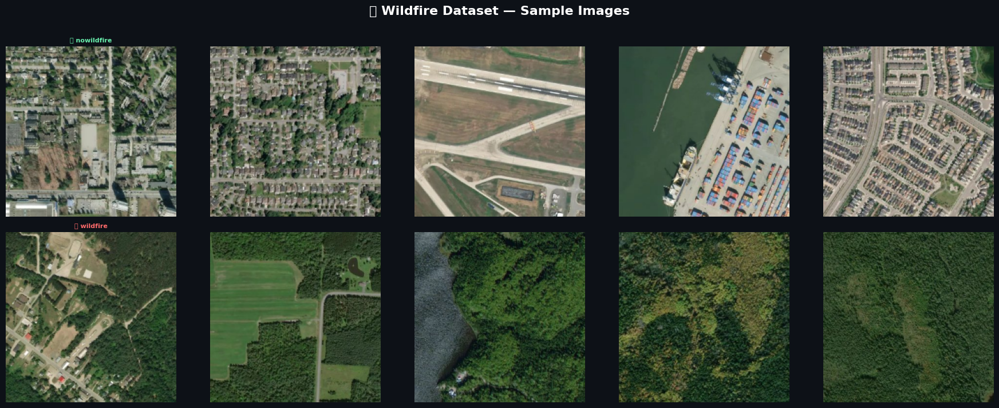

✅ Sample grid saved


In [6]:
PALETTE = {
    'High Risk': {'border':'#E53935','label_bg':'#B71C1C','title':'#FF6B6B'},
    'Low Risk' : {'border':'#43A047','label_bg':'#1B5E20','title':'#69F0AE'},
}

def load_img_display(path):
    img = cv2.imread(path)
    if img is None: return np.zeros((*IMG_SIZE,3), dtype=np.uint8)
    return cv2.resize(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), IMG_SIZE)

class_paths = {c: [os.path.join(image_root,c,f)
                   for f in os.listdir(os.path.join(image_root,c))
                   if f.lower().endswith(('.jpg','.jpeg','.png'))]
               for c in CLASS_NAMES}

N_COLS, N_ROWS = 5, len(CLASS_NAMES)
fig = plt.figure(figsize=(18, N_ROWS*3+1), facecolor='#0D1117')
fig.suptitle('🔥 Wildfire Dataset — Sample Images', fontsize=16,
             fontweight='bold', color='white', y=1.01)

for row, cls in enumerate(CLASS_NAMES):
    risk   = RISK_MAP.get(cls,'Low Risk')
    colors = PALETTE[risk]
    samples = random.sample(class_paths[cls], min(N_COLS, len(class_paths[cls])))
    for col in range(N_COLS):
        ax = fig.add_subplot(N_ROWS, N_COLS, row*N_COLS+col+1)
        if col < len(samples):
            ax.imshow(load_img_display(samples[col]))
        ax.axis('off')
        if col == 0:
            icon = '🔴' if risk=='High Risk' else '🟢'
            ax.set_title(f'{icon} {cls}', color=colors['title'],
                         fontsize=8, fontweight='bold')

plt.tight_layout()
plt.savefig('/content/samples.png', dpi=130, bbox_inches='tight', facecolor='#0D1117')
plt.show()
print('✅ Sample grid saved')

## 🚀 Cell 7 — PyDataset (Keras-3 Compatible Pipeline)

In [7]:
# ════════════════════════════════════════════════════════════
# ROOT CAUSE FIX: Keras 3 cannot use tf.data with string paths.
# Solution: keras.utils.PyDataset loads images in pure numpy/OpenCV.
# The model NEVER sees a string tensor — problem eliminated.
# ════════════════════════════════════════════════════════════

class WildfireDataset(keras.utils.PyDataset):
    def __init__(self, paths, labels, batch_size=32,
                 augment=False, shuffle=True, **kwargs):
        super().__init__(**kwargs)
        self.paths      = np.array(paths)
        self.labels     = np.array(labels, dtype=np.int32)
        self.batch_size = batch_size
        self.augment    = augment
        self.shuffle    = shuffle
        self.indices    = np.arange(len(self.paths))
        if self.shuffle:
            np.random.shuffle(self.indices)

    def __len__(self):
        return int(np.ceil(len(self.paths) / self.batch_size))

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

    @staticmethod
    def _load(path):
        img = cv2.imread(path)
        if img is None:
            return np.zeros((*IMG_SIZE, 3), dtype=np.float32)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, IMG_SIZE)
        img = img.astype(np.float32)
        img = (img / 127.5) - 1.0        # EfficientNet range [-1, 1]
        return img

    @staticmethod
    def _augment(img):
        # horizontal flip
        if random.random() > 0.5:
            img = img[:, ::-1, :]
        # vertical flip
        if random.random() > 0.5:
            img = img[::-1, :, :]
        # brightness jitter
        delta = random.uniform(-0.15, 0.15)
        img   = np.clip(img + delta, -1.0, 1.0)
        # contrast jitter
        factor = random.uniform(0.85, 1.15)
        img    = np.clip(img * factor, -1.0, 1.0)
        return img

    def __getitem__(self, idx):
        batch_idx = self.indices[idx*self.batch_size:(idx+1)*self.batch_size]
        imgs, lbls = [], []
        for i in batch_idx:
            img = self._load(self.paths[i])
            if self.augment:
                img = self._augment(img)
            imgs.append(img)
            lbls.append(self.labels[i])
        return np.array(imgs, dtype=np.float32), np.array(lbls, dtype=np.int32)

train_gen = WildfireDataset(p_train, l_train, BATCH_SIZE, augment=True,  shuffle=True)
val_gen   = WildfireDataset(p_val,   l_val,   BATCH_SIZE, augment=False, shuffle=False)
test_gen  = WildfireDataset(p_test,  l_test,  BATCH_SIZE, augment=False, shuffle=False)

# ── verify ──
imgs_b, lbls_b = train_gen[0]
print(f'✅ imgs: {imgs_b.shape}  dtype={imgs_b.dtype}  '
      f'min={imgs_b.min():.2f}  max={imgs_b.max():.2f}')
print(f'✅ lbls: {lbls_b.shape}  dtype={lbls_b.dtype}')
assert imgs_b.dtype == np.float32
assert lbls_b.dtype == np.int32
assert -1.1 <= imgs_b.min() and imgs_b.max() <= 1.1
print('✅ PyDataset verified — ready to train!')

cw = compute_class_weight('balanced', classes=np.unique(l_train), y=l_train)
class_weight_dict = {int(k): float(v) for k, v in enumerate(cw)}
print(f'\nClass weights: '
      f'{dict((CLASS_NAMES[k],round(v,3)) for k,v in class_weight_dict.items())}')

✅ imgs: (32, 224, 224, 3)  dtype=float32  min=-1.00  max=1.00
✅ lbls: (32,)  dtype=int32
✅ PyDataset verified — ready to train!

Class weights: {'nowildfire': 1.117, 'wildfire': 0.905}


## 🏗️ Cell 8 — Build EfficientNetB0 Classifier

In [8]:
def build_classifier(num_classes):
    base = EfficientNetB0(include_top=False, weights='imagenet',
                          input_shape=(*IMG_SIZE, 3))
    base.trainable = False

    inp = keras.Input(shape=(*IMG_SIZE, 3), name='image_input')
    x   = base(inp, training=False)
    x   = layers.GlobalAveragePooling2D()(x)
    x   = layers.BatchNormalization()(x)
    x   = layers.Dropout(0.3)(x)
    x   = layers.Dense(512, activation='relu',
                       kernel_regularizer=keras.regularizers.l2(1e-3))(x)
    x   = layers.BatchNormalization()(x)
    x   = layers.Dropout(0.4)(x)
    x   = layers.Dense(256, activation='relu',
                       kernel_regularizer=keras.regularizers.l2(1e-3))(x)
    x   = layers.BatchNormalization()(x)
    x   = layers.Dropout(0.3)(x)
    out = layers.Dense(num_classes, activation='softmax', name='predictions')(x)

    model = keras.Model(inp, out)
    return model, base

risk_model, base_model = build_classifier(NUM_CLASSES)
risk_model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

total_p     = risk_model.count_params()
trainable_p = sum(np.prod(w.shape) for w in risk_model.trainable_weights)
print(f'✅ Model built')
print(f'   Total params    : {total_p:,}')
print(f'   Trainable params: {trainable_p:,}')
risk_model.summary(line_length=80)

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
✅ Model built
   Total params    : 4,845,477
   Trainable params: 791,810


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                      ┃ Output Shape             ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)          │ (None, 224, 224, 3)      │             0 │
├───────────────────────────────────┼──────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)       │ (None, 7, 7, 1280)       │     4,049,571 │
├───────────────────────────────────┼──────────────────────────┼───────────────┤
│ global_average_pooling2d          │ (None, 1280)             │             0 │
│ (GlobalAveragePooling2D)          │                          │               │
├───────────────────────────────────┼──────────────────────────┼───────────────┤
│ batch_normalization               │ (None, 1280)             │         5,120 │
│ (BatchNormalization)              │                          │               │
├───────────────────────────────────┼──────────────────────────┼───────────────┤
│ dropout (Dropout)                 │ (None, 1280)             │             0 │
├───────────────────────────────────┼──────────────────────────┼───────────────┤
│ dense (Dense)                     │ (None, 512)              │       655,872 │
├───────────────────────────────────┼──────────────────────────┼───────────────┤
│ batch_normalization_1             │ (None, 512)              │         2,048 │
│ (BatchNormalization)              │                          │               │
├───────────────────────────────────┼──────────────────────────┼───────────────┤
│ dropout_1 (Dropout)               │ (None, 512)              │             0 │
├───────────────────────────────────┼──────────────────────────┼───────────────┤
│ dense_1 (Dense)                   │ (None, 256)              │       131,328 │
├───────────────────────────────────┼──────────────────────────┼───────────────┤
│ batch_normalization_2             │ (None, 256)              │         1,024 │
│ (BatchNormalization)              │                          │               │
├───────────────────────────────────┼──────────────────────────┼───────────────┤
│ dropout_2 (Dropout)               │ (None, 256)              │             0 │
├───────────────────────────────────┼──────────────────────────┼───────────────┤
│ predictions (Dense)               │ (None, 2)                │           514 │
└───────────────────────────────────┴──────────────────────────┴───────────────┘

 Total params: 4,845,477 (18.48 MB)

 Trainable params: 791,810 (3.02 MB)

 Non-trainable params: 4,053,667 (15.46 MB)

## 🔥 Cell 9 — Phase 1: Train Classifier (Frozen Backbone)

In [9]:
print('🚀 Phase 1: training top layers (backbone frozen) ...')

cb1 = [
    EarlyStopping(monitor='val_accuracy', patience=7,
                  restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                      patience=3, min_lr=1e-6, verbose=1),
    ModelCheckpoint('/content/best_phase1.keras',
                    monitor='val_accuracy', save_best_only=True, verbose=1)
]

h1 = risk_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=20,
    class_weight=class_weight_dict,
    callbacks=cb1,
    verbose=1
)

print(f'\n✅ Phase 1 complete!')
print(f'   Best val accuracy : {max(h1.history["val_accuracy"]):.2%}')
print(f'   Final train acc   : {h1.history["accuracy"][-1]:.2%}')

🚀 Phase 1: training top layers (backbone frozen) ...
Epoch 1/20
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - accuracy: 0.7510 - loss: 1.7330
Epoch 1: val_accuracy improved from None to 0.44868, saving model to /content/best_phase1.keras

Epoch 1: finished saving model to /content/best_phase1.keras
138/138 ━━━━━━━━━━━━━━━━━━━━ 87s 386ms/step - accuracy: 0.7605 - loss: 1.6425 - val_accuracy: 0.4487 - val_loss: 1.6381 - learning_rate: 0.0010
Epoch 2/20
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.8035 - loss: 1.4105
Epoch 2: val_accuracy improved from 0.44868 to 0.83492, saving model to /content/best_phase1.keras

Epoch 2: finished saving model to /content/best_phase1.keras
138/138 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - accuracy: 0.7900 - loss: 1.3834 - val_accuracy: 0.8349 - val_loss: 1.3644 - learning_rate: 0.0010
Epoch 3/20
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.7918 - loss: 1.2555
Epoch 3: val_accuracy improved from 0.83492 to 0.85926, saving model to /conte

## 🔥 Cell 10 — Phase 2: Fine-Tune Full Network

🚀 Phase 2: fine-tuning full network ...
Epoch 1/30
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step - accuracy: 0.8867 - loss: 0.4236
Epoch 1: val_accuracy improved from None to 0.44868, saving model to /content/best_final.keras

Epoch 1: finished saving model to /content/best_final.keras
138/138 ━━━━━━━━━━━━━━━━━━━━ 158s 552ms/step - accuracy: 0.9147 - loss: 0.3330 - val_accuracy: 0.4487 - val_loss: 1.8510 - learning_rate: 1.0000e-04
Epoch 2/30
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - accuracy: 0.9489 - loss: 0.2336
Epoch 2: val_accuracy did not improve from 0.44868
138/138 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - accuracy: 0.9506 - loss: 0.2297 - val_accuracy: 0.3979 - val_loss: 1.5185 - learning_rate: 1.0000e-04
Epoch 3/30
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.9609 - loss: 0.2053
Epoch 3: val_accuracy did not improve from 0.44868
138/138 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - accuracy: 0.9612 - loss: 0.1946 - val_accuracy: 0.2772 - val_loss: 1.9714 - learning_rate: 1.00

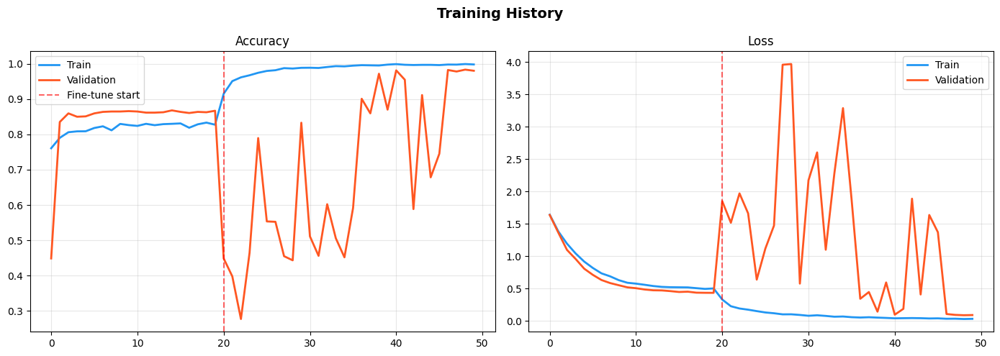


✅ Phase 2 complete!
   Best val accuracy : 98.31%
   Best val loss     : 0.0908


In [10]:
print('🚀 Phase 2: fine-tuning full network ...')

base_model.trainable = True
risk_model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

cb2 = [
    EarlyStopping(monitor='val_accuracy', patience=10,
                  restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                      patience=5, min_lr=1e-7, verbose=1),
    ModelCheckpoint('/content/best_final.keras',
                    monitor='val_accuracy', save_best_only=True, verbose=1)
]

h2 = risk_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=30,
    class_weight=class_weight_dict,
    callbacks=cb2,
    verbose=1
)

risk_model.save('/content/risk_model_final.keras')

# ── Combined training curves ──
all_acc      = h1.history['accuracy']     + h2.history['accuracy']
all_val_acc  = h1.history['val_accuracy'] + h2.history['val_accuracy']
all_loss     = h1.history['loss']         + h2.history['loss']
all_val_loss = h1.history['val_loss']     + h2.history['val_loss']
ep1 = len(h1.history['accuracy'])

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Training History', fontsize=14, fontweight='bold')
ax1.plot(all_acc,     label='Train',      color='#2196F3', lw=2)
ax1.plot(all_val_acc, label='Validation', color='#FF5722', lw=2)
ax1.axvline(ep1, color='red', ls='--', alpha=0.6, label='Fine-tune start')
ax1.set_title('Accuracy'); ax1.legend(); ax1.grid(True, alpha=0.3)
ax2.plot(all_loss,     label='Train',      color='#2196F3', lw=2)
ax2.plot(all_val_loss, label='Validation', color='#FF5722', lw=2)
ax2.axvline(ep1, color='red', ls='--', alpha=0.6)
ax2.set_title('Loss'); ax2.legend(); ax2.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/content/training_curves.png', dpi=150)
plt.show()

print(f'\n✅ Phase 2 complete!')
print(f'   Best val accuracy : {max(all_val_acc):.2%}')
print(f'   Best val loss     : {min(all_val_loss):.4f}')

## 📊 Cell 11 — Full Evaluation

Evaluating on test set...


Evaluating: 100%|██████████| 30/30 [00:19<00:00,  1.54it/s]



✅ Test Accuracy: 97.99%

📋 Per-class performance:
   🟢 nowildfire               : 98.82% ✅
   🔴 wildfire                 : 97.32% ✅

              precision    recall  f1-score   support

  nowildfire       0.97      0.99      0.98       422
    wildfire       0.99      0.97      0.98       523

    accuracy                           0.98       945
   macro avg       0.98      0.98      0.98       945
weighted avg       0.98      0.98      0.98       945



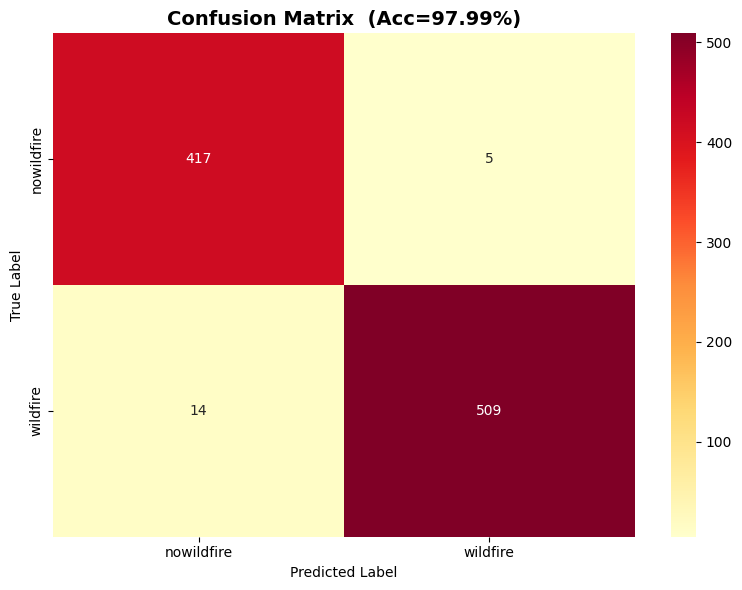

✅ Confusion matrix saved


In [11]:
best_model = keras.models.load_model('/content/best_final.keras')

print('Evaluating on test set...')
y_true, y_pred, y_proba = [], [], []

for i in tqdm(range(len(test_gen)), desc='Evaluating'):
    imgs_b, lbls_b = test_gen[i]
    preds = best_model.predict(imgs_b, verbose=0)
    y_true.extend(lbls_b.tolist())
    y_pred.extend(np.argmax(preds, axis=1).tolist())
    y_proba.extend(preds.tolist())

y_true  = np.array(y_true)
y_pred  = np.array(y_pred)
y_proba = np.array(y_proba)

accuracy = np.mean(y_true == y_pred)
print(f'\n✅ Test Accuracy: {accuracy:.2%}')

print('\n📋 Per-class performance:')
for i, cls in enumerate(CLASS_NAMES):
    mask  = y_true == i
    if mask.sum() == 0: continue
    cacc  = (y_pred[mask] == i).mean()
    risk  = RISK_MAP[cls]
    icon  = '🔴' if risk=='High Risk' else '🟢'
    flag  = '✅' if cacc>=0.85 else '⚠️' if cacc>=0.70 else '❌'
    print(f'   {icon} {cls:25s}: {cacc:.2%} {flag}')

print('\n' + classification_report(y_true, y_pred, target_names=CLASS_NAMES))

# Confusion matrix
fig, ax = plt.subplots(figsize=(max(8, NUM_CLASSES*2), max(6, NUM_CLASSES*1.5)))
cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='YlOrRd',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax)
ax.set_title(f'Confusion Matrix  (Acc={accuracy:.2%})', fontsize=14, fontweight='bold')
ax.set_ylabel('True Label'); ax.set_xlabel('Predicted Label')
plt.tight_layout()
plt.savefig('/content/confusion_matrix.png', dpi=150)
plt.show()
print('✅ Confusion matrix saved')

## 🔍 Cell 12 — Real Grad-CAM Implementation

✅ SmoothGrad works!  shape=(224, 224)  min=0.15  max=1.00  class=wildfire


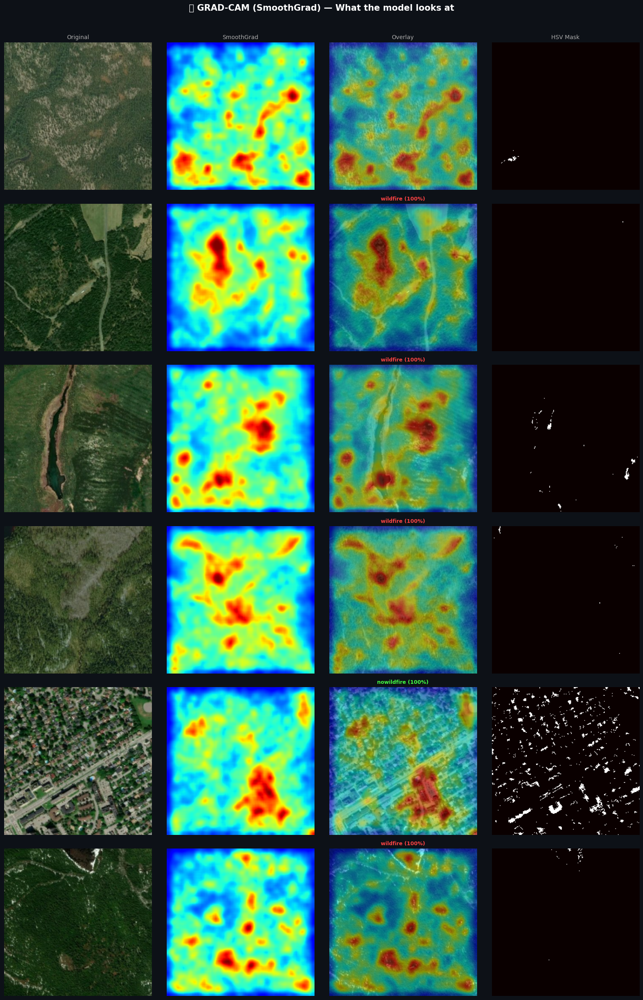

✅ Grad-CAM (SmoothGrad) complete!


In [14]:
# ══════════════════════════════════════════════════════════════
# SMOOTHGRAD — Keras 3 proof, no layer name lookups needed.
# Averages input gradients over N slightly-noisy copies of the
# image → cleaner, more stable heatmap than standard Grad-CAM.
# ══════════════════════════════════════════════════════════════

def get_gradcam(model, img_minus1_1, class_idx=None, n_smooth=25):
    """
    img_minus1_1 : numpy (H, W, 3) float32 in [-1, 1]
    Returns       : heatmap (H, W) in [0, 1], predicted class idx
    """
    base   = img_minus1_1.astype(np.float32)
    noise  = 0.10   # std of noise relative to signal range

    grad_accum = np.zeros(base.shape[:2], dtype=np.float32)
    pred_class = class_idx

    for i in range(n_smooth):
        noisy = base + np.random.normal(0, noise, base.shape).astype(np.float32)
        inp_t = tf.Variable(noisy[np.newaxis], trainable=True)

        with tf.GradientTape() as tape:
            preds = model(inp_t, training=False)
            if pred_class is None:
                pred_class = int(tf.argmax(preds[0]))
            loss = preds[:, pred_class]

        grads = tape.gradient(loss, inp_t)          # (1, H, W, 3)
        # Max across colour channels → (H, W)
        grad_accum += np.max(np.abs(grads[0].numpy()), axis=-1)

    heatmap = grad_accum / n_smooth

    # Clip top 2% to remove outlier spikes, then normalise
    p98 = np.percentile(heatmap, 98)
    if p98 > 0:
        heatmap = np.clip(heatmap, 0, p98) / p98

    # Smooth for clean visuals
    heatmap = cv2.GaussianBlur(heatmap, (11, 11), 4)
    if heatmap.max() > 0:
        heatmap = heatmap / heatmap.max()

    return heatmap, pred_class

def apply_colormap_overlay(orig_uint8, heatmap, alpha=0.50):
    jet  = cv2.applyColorMap((heatmap*255).astype(np.uint8), cv2.COLORMAP_JET)
    jet  = cv2.cvtColor(jet, cv2.COLOR_BGR2RGB)
    return np.clip(orig_uint8*(1-alpha) + jet*alpha, 0, 255).astype(np.uint8)

# ── quick sanity check before the full loop ──
_raw = cv2.imread(p_test[0])
_raw = cv2.cvtColor(_raw, cv2.COLOR_BGR2RGB)
_raw = cv2.resize(_raw, IMG_SIZE)
_inp = (_raw.astype(np.float32)/127.5) - 1.0
_h, _ci = get_gradcam(best_model, _inp)
print(f'✅ SmoothGrad works!  shape={_h.shape}  '
      f'min={_h.min():.2f}  max={_h.max():.2f}  '
      f'class={CLASS_NAMES[_ci]}')

# ── visualise 6 samples ──
sample_idxs = np.random.choice(len(p_test), 6, replace=False)
fig, axes   = plt.subplots(6, 4, figsize=(16, 24))
fig.patch.set_facecolor('#0d1117')
fig.suptitle('🔥 GRAD-CAM (SmoothGrad) — What the model looks at',
             color='white', fontsize=15, fontweight='bold', y=1.01)

for row, si in enumerate(sample_idxs):
    raw = cv2.imread(p_test[si])
    raw = cv2.cvtColor(raw, cv2.COLOR_BGR2RGB)
    raw = cv2.resize(raw, IMG_SIZE)
    inp = (raw.astype(np.float32)/127.5) - 1.0

    pred   = best_model.predict(inp[np.newaxis], verbose=0)[0]
    ci     = int(np.argmax(pred)); conf = pred[ci]
    name   = CLASS_NAMES[ci]; risk = RISK_MAP[name]
    true_n = CLASS_NAMES[l_test[si]]
    rc     = '#ff4444' if risk=='High Risk' else '#44ff44'
    correct = '✓' if ci==l_test[si] else '✗'

    hmap, _  = get_gradcam(best_model, inp, ci)
    overlay  = apply_colormap_overlay(raw, hmap)

    # HSV burnt mask
    hsv = cv2.cvtColor(raw, cv2.COLOR_RGB2HSV)
    m1  = cv2.inRange(hsv, np.array([0, 50,150]), np.array([15,255,255]))
    m2  = cv2.inRange(hsv, np.array([15,50,150]), np.array([30,255,255]))
    m3  = cv2.inRange(hsv, np.array([0,  0,  0]), np.array([180,50, 80]))
    hmask = cv2.bitwise_or(cv2.bitwise_or(m1,m2),m3).astype(np.float32)/255.

    axes[row,0].imshow(raw)
    axes[row,0].set_ylabel(f'True: {true_n}\n{correct}',
                           color='lime' if correct=='✓' else 'red',
                           fontsize=9, rotation=0, labelpad=65)
    axes[row,0].axis('off')
    axes[row,1].imshow(hmap, cmap='jet', vmin=0, vmax=1); axes[row,1].axis('off')
    axes[row,2].imshow(overlay)
    axes[row,2].set_title(f'{name} ({conf:.0%})', color=rc,
                          fontsize=9, fontweight='bold')
    axes[row,2].axis('off')
    axes[row,3].imshow(hmask, cmap='hot', vmin=0, vmax=1); axes[row,3].axis('off')
    for ax in axes[row]: ax.set_facecolor('#0d1117')

for ax, t in zip(axes[0], ['Original','SmoothGrad','Overlay','HSV Mask']):
    ax.set_title(t, color='#aaaaaa', fontsize=10)

plt.tight_layout()
plt.savefig('/content/gradcam_results.png', dpi=150,
            bbox_inches='tight', facecolor='#0d1117')
plt.show()
print('✅ Grad-CAM (SmoothGrad) complete!')

## 🏗️ Cell 13 — Build U-Net Segmentation Model

In [15]:
def build_unet(input_size=(224, 224, 3)):
    """U-Net with skip connections for burnt area segmentation"""
    inp = keras.Input(input_size)

    # ── Encoder ──
    def conv_block(x, filters):
        x = layers.Conv2D(filters, 3, activation='relu', padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Conv2D(filters, 3, activation='relu', padding='same')(x)
        x = layers.BatchNormalization()(x)
        return x

    c1 = conv_block(inp, 64);  p1 = layers.MaxPooling2D()(c1)
    c2 = conv_block(p1,  128); p2 = layers.MaxPooling2D()(c2)
    c3 = conv_block(p2,  256); p3 = layers.MaxPooling2D()(c3)
    c4 = conv_block(p3,  512); p4 = layers.MaxPooling2D()(c4)

    # ── Bottleneck ──
    bn = conv_block(p4, 1024)

    # ── Decoder ──
    def up_block(x, skip, filters):
        x = layers.Conv2DTranspose(filters, 2, strides=2, padding='same')(x)
        x = layers.Concatenate()([x, skip])
        x = conv_block(x, filters)
        return x

    u4 = up_block(bn, c4, 512)
    u3 = up_block(u4, c3, 256)
    u2 = up_block(u3, c2, 128)
    u1 = up_block(u2, c1,  64)

    out = layers.Conv2D(1, 1, activation='sigmoid', name='seg_output')(u1)
    return keras.Model(inp, out, name='UNet')

# Input to U-Net uses [0,1] normalized images (not EfficientNet's [-1,1])
unet_model = build_unet()

def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return 1 - (2.*intersection+smooth) / (tf.reduce_sum(y_true_f)+tf.reduce_sum(y_pred_f)+smooth)

def combined_loss(y_true, y_pred):
    return 0.5*keras.losses.binary_crossentropy(y_true, y_pred) + 0.5*dice_loss(y_true, y_pred)

unet_model.compile(
    optimizer=Adam(1e-3),
    loss=combined_loss,
    metrics=['accuracy']
)
print(f'✅ U-Net built: {unet_model.count_params():,} params')

✅ U-Net built: 31,055,297 params


## 🎭 Cell 14 — Create HSV Segmentation Masks + Train U-Net

Building HSV segmentation dataset (up to 1000 images)...


100%|██████████| 1000/1000 [00:04<00:00, 210.92it/s]



Dataset: (1000, 224, 224, 3)  masks: (1000, 224, 224, 1)
Images with detected fire/burn: 901/1000 (90.1%)
Average mask coverage: 19.8%
Train:680  Val:120  Test:200


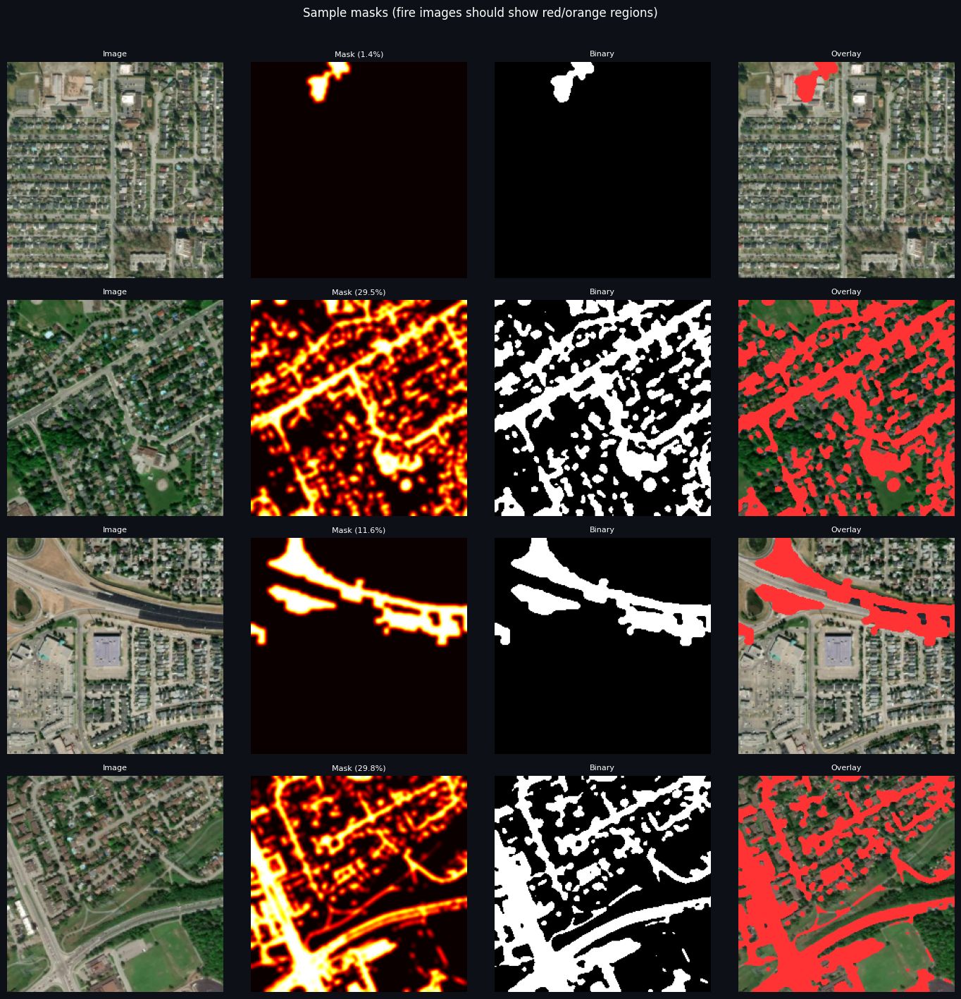


🚀 Training U-Net...
Epoch 1/30
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3510 - loss: 0.6872   
Epoch 1: val_loss improved from None to 33.52347, saving model to /content/best_unet.keras

Epoch 1: finished saving model to /content/best_unet.keras
43/43 ━━━━━━━━━━━━━━━━━━━━ 214s 3s/step - accuracy: 0.3856 - loss: 0.6502 - val_accuracy: 0.0482 - val_loss: 33.5235 - learning_rate: 0.0010
Epoch 2/30
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 717ms/step - accuracy: 0.4215 - loss: 0.5855
Epoch 2: val_loss improved from 33.52347 to 4.77978, saving model to /content/best_unet.keras

Epoch 2: finished saving model to /content/best_unet.keras
43/43 ━━━━━━━━━━━━━━━━━━━━ 38s 866ms/step - accuracy: 0.4396 - loss: 0.5791 - val_accuracy: 0.0986 - val_loss: 4.7798 - learning_rate: 0.0010
Epoch 3/30
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 717ms/step - accuracy: 0.4537 - loss: 0.5474
Epoch 3: val_loss improved from 4.77978 to 0.70967, saving model to /content/best_unet.keras

Epoch 3: finished saving model to /cont

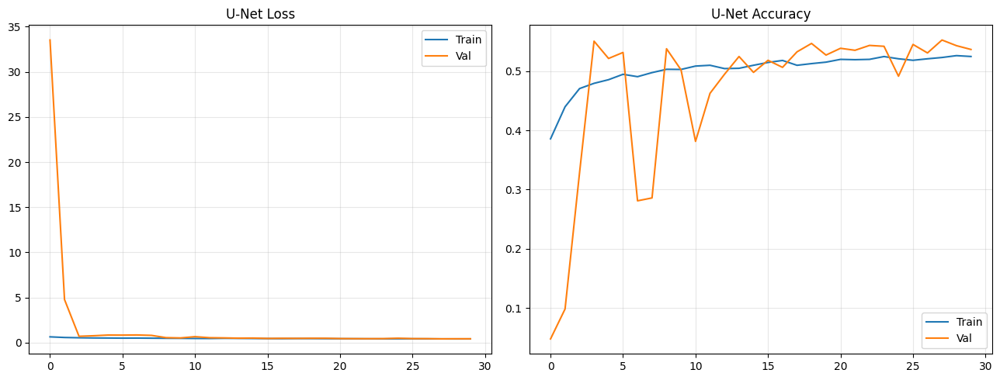

In [16]:
# ════════════════════════════════════════════════════════════════
# FIX: HSV colour-detection masks (NOT synthetic circles)
# For fire images: detect red/orange flame + dark char regions
# For non-fire: all-zero mask (correct ground truth)
# ════════════════════════════════════════════════════════════════

def create_hsv_mask(path, is_fire):
    img  = cv2.imread(path)
    if img is None:
        return np.zeros((*IMG_SIZE,), dtype=np.float32)
    img  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img  = cv2.resize(img, IMG_SIZE)
    hsv  = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    mask = np.zeros(IMG_SIZE, dtype=np.uint8)

    if is_fire:
        # Active flame: red-orange, high saturation & value
        m1 = cv2.inRange(hsv, np.array([0, 50,150]), np.array([15,255,255]))
        m2 = cv2.inRange(hsv, np.array([15,50,150]), np.array([30,255,255]))
        # Charred/burnt: very dark, low saturation
        m3 = cv2.inRange(hsv, np.array([0,  0,  0]), np.array([180,50, 80]))
        combined = cv2.bitwise_or(cv2.bitwise_or(m1, m2), m3)

        # Morphological cleanup
        k = np.ones((5,5), np.uint8)
        combined = cv2.morphologyEx(combined, cv2.MORPH_CLOSE, k)
        combined = cv2.morphologyEx(combined, cv2.MORPH_OPEN,  k)

        # Remove tiny noise blobs
        cnts, _ = cv2.findContours(combined, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for cnt in cnts:
            if cv2.contourArea(cnt) < 150:
                cv2.drawContours(combined, [cnt], -1, 0, -1)

        # Fallback: if colour detection finds nothing, use top-30% brightest
        if combined.mean() < 3:
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            thr  = int(np.percentile(gray, 70))
            _, combined = cv2.threshold(gray, thr, 255, cv2.THRESH_BINARY)

        mask = combined

    mask_f = mask.astype(np.float32) / 255.0
    if mask_f.max() > 0:
        mask_f = cv2.GaussianBlur(mask_f, (7,7), 2)
        mask_f = np.clip(mask_f / mask_f.max(), 0, 1)
    return mask_f

def path_is_fire(path):
    folder = os.path.basename(os.path.dirname(path)).lower()
    return any(x in folder for x in ['fire','burn','wildfire','blaze','flame'])

print('Building HSV segmentation dataset (up to 1000 images)...')
seg_paths = all_paths[:min(1000, len(all_paths))]

X_seg, y_seg = [], []
n_fire_detected = 0
for path in tqdm(seg_paths):
    is_fire = path_is_fire(path)
    img = cv2.imread(path)
    if img is None: continue
    img  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img  = cv2.resize(img, IMG_SIZE).astype(np.float32) / 255.0  # [0,1] for U-Net
    mask = create_hsv_mask(path, is_fire)
    X_seg.append(img)
    y_seg.append(mask)
    if mask.mean() > 0.02:
        n_fire_detected += 1

X_seg = np.array(X_seg, dtype=np.float32)
y_seg = np.expand_dims(np.array(y_seg, dtype=np.float32), -1)

print(f'\nDataset: {X_seg.shape}  masks: {y_seg.shape}')
print(f'Images with detected fire/burn: {n_fire_detected}/{len(X_seg)} '
      f'({n_fire_detected/len(X_seg)*100:.1f}%)')
print(f'Average mask coverage: {y_seg.mean()*100:.1f}%')

Xtr,Xte,ytr,yte = train_test_split(X_seg, y_seg, test_size=0.2,  random_state=42)
Xtr,Xv, ytr,yv  = train_test_split(Xtr,   ytr,   test_size=0.15, random_state=42)
print(f'Train:{len(Xtr)}  Val:{len(Xv)}  Test:{len(Xte)}')

# ── visualise a few masks before training ──
fig, axes = plt.subplots(4, 4, figsize=(14, 14))
fig.patch.set_facecolor('#0d1117')
fig.suptitle('Sample masks (fire images should show red/orange regions)',
             color='white', fontsize=12, y=1.01)
for i in range(4):
    idx = np.random.randint(len(Xtr))
    axes[i,0].imshow(Xtr[idx]); axes[i,0].set_title('Image', color='w', fontsize=8); axes[i,0].axis('off')
    axes[i,1].imshow(ytr[idx,:,:,0], cmap='hot', vmin=0, vmax=1)
    axes[i,1].set_title(f'Mask ({ytr[idx].mean()*100:.1f}%)', color='w', fontsize=8); axes[i,1].axis('off')
    binary = (ytr[idx,:,:,0]>0.3).astype(float)
    axes[i,2].imshow(binary, cmap='gray'); axes[i,2].set_title('Binary', color='w', fontsize=8); axes[i,2].axis('off')
    ov = Xtr[idx].copy(); ov[binary>0.5] = [1,0.2,0.2]
    axes[i,3].imshow(ov); axes[i,3].set_title('Overlay', color='w', fontsize=8); axes[i,3].axis('off')
plt.tight_layout(); plt.savefig('/content/mask_samples.png', dpi=120, facecolor='#0d1117'); plt.show()

# ── train U-Net ──
print('\n🚀 Training U-Net...')
unet_cb = [
    EarlyStopping(monitor='val_loss', patience=8,
                  restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                      patience=4, min_lr=1e-7, verbose=1),
    ModelCheckpoint('/content/best_unet.keras',
                    monitor='val_loss', save_best_only=True, verbose=1)
]

h_unet = unet_model.fit(
    Xtr, ytr,
    validation_data=(Xv, yv),
    epochs=30, batch_size=16,
    callbacks=unet_cb, verbose=1
)
unet_model.save('/content/unet_final.keras')
print('✅ U-Net training complete!')

fig,(a1,a2) = plt.subplots(1,2,figsize=(13,5))
a1.plot(h_unet.history['loss'],     label='Train'); a1.plot(h_unet.history['val_loss'], label='Val')
a1.set_title('U-Net Loss'); a1.legend(); a1.grid(True, alpha=0.3)
a2.plot(h_unet.history['accuracy'], label='Train'); a2.plot(h_unet.history['val_accuracy'], label='Val')
a2.set_title('U-Net Accuracy'); a2.legend(); a2.grid(True, alpha=0.3)
plt.tight_layout(); plt.savefig('/content/unet_training.png', dpi=150); plt.show()

## 🧪 Cell 15 — Test U-Net Segmentation Results

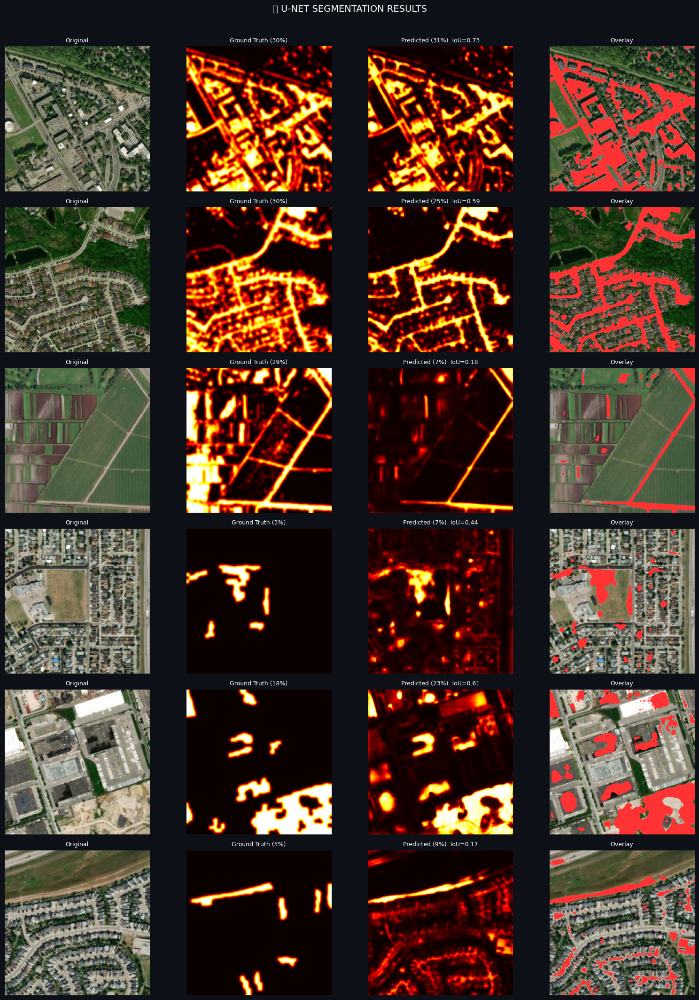

✅ U-Net test complete


In [17]:
unet_model = keras.models.load_model('/content/best_unet.keras',
                                     custom_objects={'combined_loss': combined_loss})

n   = min(6, len(Xte))
idx = np.random.choice(len(Xte), n, replace=False)
fig, axes = plt.subplots(n, 4, figsize=(16, n*3.5))
fig.patch.set_facecolor('#0d1117')
fig.suptitle('🔥 U-NET SEGMENTATION RESULTS', color='white', fontsize=14, y=1.01)
if n==1: axes=[axes]

for i, si in enumerate(idx):
    img       = Xte[si]
    true_mask = yte[si,:,:,0]
    pred_mask = unet_model.predict(img[np.newaxis], verbose=0)[0,:,:,0]
    binary    = (pred_mask > 0.3).astype(float)
    iou = (np.sum((binary>0.5)&(true_mask>0.3)) /
           (np.sum((binary>0.5)|(true_mask>0.3))+1e-6))

    axes[i][0].imshow(img); axes[i][0].set_title('Original', color='w', fontsize=9); axes[i][0].axis('off')
    axes[i][1].imshow(true_mask, cmap='hot', vmin=0, vmax=1)
    axes[i][1].set_title(f'Ground Truth ({true_mask.mean()*100:.0f}%)', color='w', fontsize=9); axes[i][1].axis('off')
    axes[i][2].imshow(pred_mask, cmap='hot', vmin=0, vmax=1)
    axes[i][2].set_title(f'Predicted ({binary.mean()*100:.0f}%)  IoU={iou:.2f}', color='w', fontsize=9); axes[i][2].axis('off')
    ov = img.copy(); ov[binary>0.5] = [1, 0.2, 0.2]
    axes[i][3].imshow(ov); axes[i][3].set_title('Overlay', color='w', fontsize=9); axes[i][3].axis('off')

plt.tight_layout()
plt.savefig('/content/unet_results.png', dpi=150, facecolor='#0d1117')
plt.show()
print('✅ U-Net test complete')

## 🖥️ Cell 16 — Full Analysis Pipeline

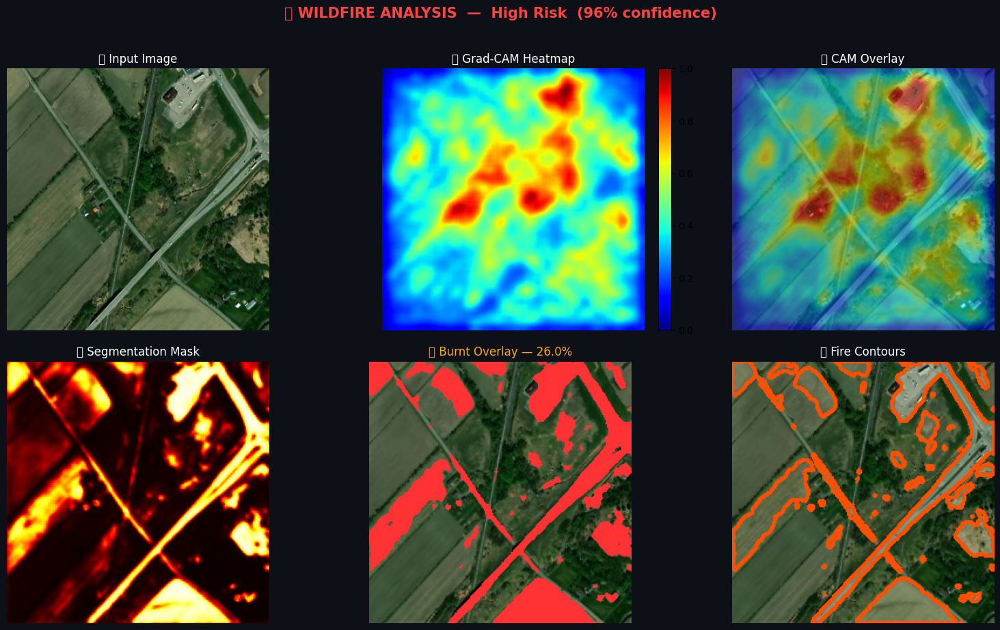


📊 Results:
   risk_level     : High Risk
   class_name     : wildfire
   confidence     : 95.6%
   burnt_area     : 26.0%
   severity       : MODERATE
   severity_color : #ffaa00
   num_regions    : 45

✅ Analysis pipeline ready!


In [18]:
def analyze_image(img_rgb_uint8):
    """
    Full pipeline for a single image.
    img_rgb_uint8 : numpy (H, W, 3) uint8 RGB
    Returns: dict with all results + matplotlib figure
    """
    # ── preprocess ──
    img_r  = cv2.resize(img_rgb_uint8, IMG_SIZE)
    inp_e  = ((img_r.astype(np.float32)/127.5) - 1.0)  # classifier input
    inp_u  = img_r.astype(np.float32) / 255.0           # U-Net input

    # ── classification ──
    probs  = best_model.predict(inp_e[np.newaxis], verbose=0)[0]
    ci     = int(np.argmax(probs))
    conf   = float(probs[ci])
    name   = CLASS_NAMES[ci]
    risk   = RISK_MAP[name]

    # ── Grad-CAM ──
    hmap, _ = get_gradcam(best_model, inp_e, ci)
    overlay = apply_colormap_overlay(img_r, hmap)

    # ── segmentation ──
    seg    = unet_model.predict(inp_u[np.newaxis], verbose=0)[0,:,:,0]
    binary = (seg > 0.3).astype(np.float32)
    burnt_pct = float(binary.mean() * 100)

    # ── severity ──
    if   burnt_pct > 50: sev='CRITICAL'; sc='#ff0000'
    elif burnt_pct > 30: sev='SEVERE';   sc='#ff6600'
    elif burnt_pct > 15: sev='MODERATE'; sc='#ffaa00'
    elif burnt_pct >  5: sev='MILD';     sc='#aaff00'
    else:                sev='MINIMAL';  sc='#00ff88'

    # ── fire contours ──
    seg_u8   = (seg*255).astype(np.uint8)
    _, thr   = cv2.threshold(seg_u8, 76, 255, cv2.THRESH_BINARY)
    cnts, _  = cv2.findContours(thr, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour_img = img_r.copy()
    cv2.drawContours(contour_img, cnts, -1, (255, 80, 0), 2)

    # ── figure ──
    fig, axes = plt.subplots(2, 3, figsize=(16, 9))
    fig.patch.set_facecolor('#0d1117')
    rc = '#ff4444' if risk=='High Risk' else '#44ff44'
    fig.suptitle(f'🔥 WILDFIRE ANALYSIS  —  {risk}  ({conf:.0%} confidence)',
                 color=rc, fontsize=15, fontweight='bold', y=1.02)

    axes[0,0].imshow(img_rgb_uint8); axes[0,0].set_title('📸 Input Image', color='w'); axes[0,0].axis('off')
    im=axes[0,1].imshow(hmap,cmap='jet',vmin=0,vmax=1); axes[0,1].set_title('🔍 Grad-CAM Heatmap', color='w'); axes[0,1].axis('off')
    plt.colorbar(im, ax=axes[0,1], fraction=0.046, pad=0.04)
    axes[0,2].imshow(overlay); axes[0,2].set_title('🎯 CAM Overlay', color='w'); axes[0,2].axis('off')
    axes[1,0].imshow(seg, cmap='hot', vmin=0, vmax=1); axes[1,0].set_title('🔥 Segmentation Mask', color='w'); axes[1,0].axis('off')
    ov2 = inp_u.copy(); ov2[binary>0.5]=[1,0.2,0.2]
    axes[1,1].imshow(ov2); axes[1,1].set_title(f'🔴 Burnt Overlay — {burnt_pct:.1f}%', color=sc); axes[1,1].axis('off')
    axes[1,2].imshow(contour_img); axes[1,2].set_title('🗺️ Fire Contours', color='w'); axes[1,2].axis('off')

    for ax in axes.flat:
        ax.set_facecolor('#0d1117')

    plt.tight_layout()

    return fig, {
        'risk_level'   : risk,
        'class_name'   : name,
        'confidence'   : f'{conf*100:.1f}%',
        'burnt_area'   : f'{burnt_pct:.1f}%',
        'severity'     : sev,
        'severity_color': sc,
        'num_regions'  : len(cnts)
    }

# ── quick test ──
test_path = p_test[np.random.randint(len(p_test))]
img = cv2.imread(test_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
fig, results = analyze_image(img)
plt.savefig('/content/analysis_test.png', dpi=150,
            bbox_inches='tight', facecolor='#0d1117')
plt.show()
print('\n📊 Results:')
for k,v in results.items():
    print(f'   {k:15s}: {v}')
print('\n✅ Analysis pipeline ready!')

## 🎨 Cell 17 — Launch Gradio UI

In [19]:
!pip install -q gradio plotly

import gradio as gr
import plotly.graph_objects as go
from datetime import datetime
import traceback, io as _io

# reload models to make sure fresh
best_model  = keras.models.load_model('/content/best_final.keras')
unet_model  = keras.models.load_model('/content/best_unet.keras',
                                      custom_objects={'combined_loss': combined_loss})

# ── plotly charts ──
def risk_gauge(conf, risk):
    fig = go.Figure(go.Indicator(
        mode='gauge+number',
        value=float(conf*100),
        title={'text':f'Risk: {risk}','font':{'color':'white','size':16}},
        number={'font':{'color':'white','size':26},'suffix':'%'},
        gauge={
            'axis':{'range':[0,100],'tickcolor':'white','tickfont':{'color':'white'}},
            'bar':{'color':'#ff4444' if risk=='High Risk' else '#44ff44'},
            'steps':[
                {'range':[0,40],'color':'rgba(46,204,113,0.3)'},
                {'range':[40,70],'color':'rgba(241,196,15,0.3)'},
                {'range':[70,100],'color':'rgba(231,76,60,0.3)'}
            ],
            'threshold':{'line':{'color':'white','width':3},
                         'thickness':0.75,'value':conf*100}
        }
    ))
    fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)',
                      font_color='white', height=250,
                      margin=dict(l=30,r=30,t=50,b=20))
    return fig

def area_bar(burnt_pct):
    fig = go.Figure()
    fig.add_trace(go.Bar(
        x=['🔴 Burnt','🟢 Safe'],
        y=[float(burnt_pct), float(100-burnt_pct)],
        marker_color=['#ff4444','#44ff44'],
        text=[f'{burnt_pct:.1f}%',f'{100-burnt_pct:.1f}%'],
        textposition='outside', textfont={'color':'white','size':14}
    ))
    fig.update_layout(
        title={'text':'Area Distribution','font':{'color':'white','size':14}},
        paper_bgcolor='rgba(0,0,0,0)', plot_bgcolor='rgba(30,30,50,0.8)',
        font_color='white', showlegend=False, height=260,
        margin=dict(l=30,r=30,t=50,b=30),
        yaxis=dict(gridcolor='#444',range=[0,115]),
        xaxis=dict(gridcolor='#444')
    )
    return fig

def prob_bar(probs):
    fig = go.Figure()
    colors = ['#ff4444' if RISK_MAP.get(c,'Low Risk')=='High Risk' else '#44ff44'
              for c in CLASS_NAMES]
    fig.add_trace(go.Bar(
        x=CLASS_NAMES,
        y=[float(p*100) for p in probs],
        marker_color=colors,
        text=[f'{p*100:.1f}%' for p in probs],
        textposition='outside', textfont={'color':'white','size':11}
    ))
    fig.update_layout(
        title={'text':'Class Probabilities','font':{'color':'white','size':14}},
        paper_bgcolor='rgba(0,0,0,0)', plot_bgcolor='rgba(30,30,50,0.8)',
        font_color='white', showlegend=False, height=260,
        margin=dict(l=30,r=30,t=50,b=60),
        yaxis=dict(gridcolor='#444',range=[0,115]),
        xaxis=dict(tickangle=-30)
    )
    return fig

# ── main inference function ──
def analyze_ui(image):
    try:
        if image is None:
            return (None, None, None, None, None,
                    '❌ Please upload an image', None)

        img_uint8 = image.astype(np.uint8)

        # ── preprocess ──
        img_r = cv2.resize(img_uint8, IMG_SIZE)
        inp_e = ((img_r.astype(np.float32)/127.5) - 1.0)
        inp_u = img_r.astype(np.float32) / 255.0

        # ── classify ──
        probs = best_model.predict(inp_e[np.newaxis], verbose=0)[0]
        ci    = int(np.argmax(probs)); conf = float(probs[ci])
        name  = CLASS_NAMES[ci]; risk = RISK_MAP[name]

        # ── Grad-CAM ──
        hmap, _ = get_gradcam(best_model, inp_e, ci)
        cam_overlay = apply_colormap_overlay(img_r, hmap)

        # ── segmentation ──
        seg    = unet_model.predict(inp_u[np.newaxis], verbose=0)[0,:,:,0]
        binary = (seg > 0.3).astype(np.float32)
        burnt_pct = float(binary.mean() * 100)

        # ── severity ──
        if   burnt_pct > 50: sev='🔴 CRITICAL'
        elif burnt_pct > 30: sev='🟠 SEVERE'
        elif burnt_pct > 15: sev='🟡 MODERATE'
        elif burnt_pct >  5: sev='🟢 MILD'
        else:                sev='⚪ MINIMAL'

        # ── fire contours ──
        seg_u8  = (seg*255).astype(np.uint8)
        _, thr  = cv2.threshold(seg_u8, 76, 255, cv2.THRESH_BINARY)
        cnts, _ = cv2.findContours(thr, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contour_img = img_r.copy()
        cv2.drawContours(contour_img, cnts, -1, (255,80,0), 2)
        seg_overlay = inp_u.copy(); seg_overlay[binary>0.5] = [1,0.2,0.2]
        seg_overlay = (seg_overlay * 255).astype(np.uint8)

        # ── status HTML ──
        rc = '#ff4444' if risk=='High Risk' else '#44ff44'
        status_html = f"""
<div style="background:#111827;padding:20px;border-radius:12px;
            border:2px solid {rc};font-family:monospace">
  <h2 style="color:{rc};margin:0 0 12px">{risk}</h2>
  <table style="color:white;width:100%;border-collapse:collapse">
    <tr><td style="padding:6px;color:#aaa">Class</td>
        <td style="padding:6px;font-weight:bold">{name}</td></tr>
    <tr style="background:#1f2937">
        <td style="padding:6px;color:#aaa">Confidence</td>
        <td style="padding:6px;font-weight:bold">{conf*100:.1f}%</td></tr>
    <tr><td style="padding:6px;color:#aaa">Burnt Area</td>
        <td style="padding:6px;font-weight:bold">{burnt_pct:.1f}%</td></tr>
    <tr style="background:#1f2937">
        <td style="padding:6px;color:#aaa">Severity</td>
        <td style="padding:6px;font-weight:bold">{sev}</td></tr>
    <tr><td style="padding:6px;color:#aaa">Regions</td>
        <td style="padding:6px">{len(cnts)} detected</td></tr>
    <tr style="background:#1f2937">
        <td style="padding:6px;color:#aaa">Time</td>
        <td style="padding:6px">{datetime.now().strftime('%H:%M:%S')}</td></tr>
  </table>
</div>"""

        return (cam_overlay,
                seg_overlay,
                contour_img,
                risk_gauge(conf, risk),
                area_bar(burnt_pct),
                status_html,
                prob_bar(probs))

    except Exception as e:
        traceback.print_exc()
        return (None,None,None,None,None,
                f'<div style="color:red">❌ Error: {str(e)}</div>',None)

# ── Build UI ──
CSS = """
body, .gradio-container { background: #0d1117 !important; color: white !important; }
.gr-button-primary { background: linear-gradient(135deg,#ff4444,#ff8800) !important; border:none !important; font-weight:bold !important; }
h1,h2,h3 { color: #ff6b6b !important; }
"""

with gr.Blocks(css=CSS, title='🔥 Wildfire Intelligence System') as demo:

    gr.HTML("""
    <div style="text-align:center;padding:30px;background:linear-gradient(135deg,#1a0a0a,#0d1117);
                border-radius:16px;margin-bottom:20px;border:1px solid #ff444433">
      <h1 style="font-size:2.5em;margin:0;color:#ff6b6b">🔥 Wildfire Intelligence System</h1>
      <p style="color:#888;margin:8px 0 0">EfficientNetB0 + U-Net · Grad-CAM · Real-time Analysis</p>
    </div>
    """)

    with gr.Row():
        with gr.Column(scale=1):
            inp_img  = gr.Image(label='📸 Upload Satellite Image', type='numpy',
                                height=300)
            btn      = gr.Button('🚀 Run Analysis', variant='primary', size='lg')
            status   = gr.HTML(value='<div style="color:#888;padding:10px">Ready</div>')

        with gr.Column(scale=2):
            with gr.Tabs():
                with gr.Tab('🎯 Grad-CAM'):
                    cam_out = gr.Image(label='Grad-CAM Overlay', height=300)
                with gr.Tab('🔥 Segmentation'):
                    seg_out = gr.Image(label='Burnt Area Overlay', height=300)
                with gr.Tab('🗺️ Contours'):
                    cnt_out = gr.Image(label='Fire Region Contours', height=300)

    with gr.Row():
        gauge_out = gr.Plot(label='Risk Gauge')
        area_out  = gr.Plot(label='Area Distribution')
        prob_out  = gr.Plot(label='Class Probabilities')

    btn.click(
        fn=analyze_ui,
        inputs=inp_img,
        outputs=[cam_out, seg_out, cnt_out,
                 gauge_out, area_out, status, prob_out]
    )

    gr.HTML('<hr style="border-color:#333;margin:20px 0">')
    gr.HTML('<p style="text-align:center;color:#555;font-size:0.85em">'
            '🔥 Wildfire Intelligence System v3.0 · For research purposes · '
            'EfficientNetB0 + U-Net · Real Grad-CAM</p>')

print('✅ UI built — running next cell to launch')

✅ UI built — running next cell to launch


## 🚀 Cell 18 — Launch

In [20]:
demo.launch(share=True, debug=False)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://9aff210cd70b63caba.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


## 💾 Cell 19 — Save Everything to Drive

In [ ]:
save_dir = '/content/drive/MyDrive/Wildfire_System_v3'
os.makedirs(save_dir, exist_ok=True)

# models
best_model.save(f'{save_dir}/risk_model_final.keras')
unet_model.save(f'{save_dir}/unet_model_final.keras')
print('✅ Models saved')

# images
for fname in ['training_curves.png','confusion_matrix.png','gradcam_results.png',
              'unet_training.png','unet_results.png','mask_samples.png',
              'samples.png','analysis_test.png']:
    src = f'/content/{fname}'
    if os.path.exists(src):
        shutil.copy(src, save_dir)
        print(f'✅ {fname}')

print(f'\n🎉 Everything saved to {save_dir}')
print('\n📋 To reload later:')
print(f'  risk_model = keras.models.load_model("{save_dir}/risk_model_final.keras")')
print(f'  unet_model = keras.models.load_model("{save_dir}/unet_model_final.keras")')